![](img/TOC.svg)

# Case Studies: Polymer Melts

In this example, we use `pyPRISM` to study and understand two simple but important systems: A dense, linear homopolymer melt of varying density and a ring homopolymer melt of varying molecular mass. In the linear melt system, we take advantage of the fact that PRISM theory doesn't have a simulation 'box' and study very long (N=16,000) gaussian polymer chains. Note that studing chains of this length using Molecular Dynamics or Monte Carlo techniques would be difficult if not impossible. In the ring melt system, we leverage PRISM's speed to quickly span a parameter space in molecular mass that would be challenging/time consuming to replicate synthetically. 

### Concepts
- 1 component PRISM
- Phase space "hopping"
- Gaussian chains

### Tools 
- pyPRISM.calculate.structure_factor
- pyPRISM.calculate.pair_correlation

### References
1. Curro, J.G.; Schweizer K.S.; Integral Equation Theory of Homopolymer
   Melts, Molecular Crystals and Liquid Crystals Incorporating Nonlinear 
   Optics, 1990, 180:1, 77-89, doi: 10.1080/00268949008025790
2. Curro, J.G.; Schweizer K.S.; Theory of Polymer Melts: An Integral Equation Approach,
   Macromolecules, 1987, 20, 1928-1934, doi: 10.1021/ma00174a040
 
  

## Notebook Setup
To begin, please run `Kernel-> Restart & Clear Output` from the menu at the top of the notebook. It is a good idea to run this before starting any notebook so that the notebook is fresh for the user. Next, run the cell below (via the top menu-bar or `<Shift-Enter>`. If the cell throws an import error, there is likely something wrong with your environment.

If successful, you should see a set of logos appear below the cell. Which logos appear depend on what is inside the `hv.extension()` command at the bottom of the cell. If no logos appear and the cell throws an error, there is likely something wrong with your environment. 

### Troubleshooting:
- Did you activate the correct conda environment before starting the jupyter notebook? 
- If not using anaconda, did you install all dependencies before starting the jupyter notebook? 
- Is pyPRISM installed in your current environment on your `PYTHONPATH`? 

Holoviews + Bokeh Logos: ![Logos](img/import_check_bokeh.png)


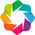

In [1]:
import pyPRISM
import numpy as np
import holoviews as hv
hv.extension('bokeh')

## Linear Homopolymer Melt: Comparison to Hard Sphere Fluid

First, we solve the hard-sphere fluid (HSF) system from the previous notebook. Note that while variables are "global" within a Jupyter notebook, separate notebooks do not share variables so we have to re-do this calculation here. 

In [2]:
sys = pyPRISM.System(['A'],kT=1.0)
sys.domain = pyPRISM.Domain(dr=0.005,length=32768)
sys.diameter['A']      = 1.0
sys.potential['A','A'] = pyPRISM.potential.HardSphere()
sys.density['A']       = 0.8
sys.omega['A','A']     = pyPRISM.omega.SingleSite()
sys.closure['A','A']   = pyPRISM.closure.PY(apply_hard_core=True)
PRISM_HSF = sys.createPRISM()
PRISM_HSF.solve()

x_HSF = sys.domain.r 
y_HSF = pyPRISM.calculate.pair_correlation(PRISM_HSF)['A','A']

print('Done!')

0:  |F(x)| = 2.62378; step 1; tol 0.266006
1:  |F(x)| = 1.7493; step 1; tol 0.400054
2:  |F(x)| = 0.639398; step 1; tol 0.144039
3:  |F(x)| = 0.171478; step 1; tol 0.064732
4:  |F(x)| = 0.0061731; step 1; tol 0.00116635
5:  |F(x)| = 3.6306e-06; step 1; tol 3.1131e-07
Done!


Then, we move onto the polmer melt case. Note that the only difference is the *intra*-molecular structure function ($\hat{\omega}(k)$).

In [3]:
sys.omega['A','A'] = pyPRISM.omega.Gaussian(length=16000,sigma=sys.diameter.sigma['A','A'])
PRISM_Melt = sys.createPRISM()
PRISM_Melt.solve()

x_Melt = sys.domain.r 
y_Melt = pyPRISM.calculate.pair_correlation(PRISM_Melt)['A','A']

print('Done!')

0:  |F(x)| = 49.5243; step 0.339595; tol 0.387728
1:  |F(x)| = 1.78199; step 1; tol 0.135299
2:  |F(x)| = 0.179791; step 1; tol 0.00916154
3:  |F(x)| = 0.00469128; step 1; tol 0.00061276
4:  |F(x)| = 1.06474e-06; step 1; tol 4.63608e-08
Done!


In [4]:
%%opts Overlay [width=500,height=400,legend_position='top_right']

HSF = hv.Curve((x_HSF,y_HSF),label='Hard-Sphere Fluid',extents=(0,0,25,None))
Melt = hv.Curve((x_Melt,y_Melt),label='Gaussian Melt',extents=(0,0,25,None))

hv.Overlay([HSF,Melt])

/Users/tbm/anaconda3/envs/pyPRISM_py3_dev/lib/python3.5/site-packages/bokeh/core/json_encoder.py:80: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(type(obj), np.float):


:Overlay
   .Curve.Hard_hyphen_minus_Sphere_Fluid :Curve   [x]   (y)
   .Curve.Gaussian_Melt                  :Curve   [x]   (y)

Now, let's explore the effect of $\hat{\omega}(k)$ on the pair correlation function. Insert the following $\hat{\omega}(k)$ into the cell below. 

**Note that the length is purposefully changed for the last two $\omega$**.
- sys.omega['A','A'] = pyPRISM.omega.GaussianRing(length=16000,sigma=diameter)
- sys.omega['A','A'] = pyPRISM.omega.FreelyJointedChain(length=16000,l=diameter)
- sys.omega['A','A'] = pyPRISM.omega.NFJC(length=50,l=diameter)
- sys.omega['A','A'] = pyPRISM.omega.DiscreteKoyama(sigma=1.0,l=diameter,length=50,lp=4/3)

In [5]:
%%opts Overlay [width=500,height=400,legend_position='top_right']

# Change setting below
# ----------------------------------
sys.omega['A','A'] = pyPRISM.omega.GaussianRing(length=16000,sigma=sys.diameter['A','A'])
# ----------------------------------

PRISM_Melt = sys.createPRISM()
PRISM_Melt.solve()

x_Melt2 = sys.domain.r 
y_Melt2 = pyPRISM.calculate.pair_correlation(PRISM_Melt)['A','A']

Melt2 = hv.Curve((x_Melt2,y_Melt2),label='Melt',extents=(0,0,25,None))
hv.Overlay([HSF,Melt,Melt2])

0:  |F(x)| = 74.9574; step 0.207911; tol 0.564059
1:  |F(x)| = 66.9753; step 0.10813; tol 0.718526
2:  |F(x)| = 63.8153; step 0.0570141; tol 0.817077
3:  |F(x)| = 63.7309; step 0.00258947; tol 0.897623
4:  |F(x)| = 62.9689; step 0.0238493; tol 0.878604
5:  |F(x)| = 62.6251; step 0.0143713; tol 0.8902
6:  |F(x)| = 61.7205; step 0.043927; tol 0.874189
7:  |F(x)| = 61.4057; step 0.027459; tol 0.890842
8:  |F(x)| = 60.0192; step 0.0767573; tol 0.859817
9:  |F(x)| = 59.9172; step 0.0237562; tol 0.896941
10:  |F(x)| = 59.9171; step 1.36861e-05; tol 0.899998
11:  |F(x)| = 59.8818; step 0.00854459; tol 0.89894
12:  |F(x)| = 59.8242; step 0.0282903; tol 0.898267
13:  |F(x)| = 59.7705; step 0.0276366; tol 0.898386
14:  |F(x)| = 59.7515; step 0.0103058; tol 0.899429
15:  |F(x)| = 59.7415; step 0.0055558; tol 0.899697
16:  |F(x)| = 59.7017; step 0.0219347; tol 0.898802
17:  |F(x)| = 59.6177; step 0.0259644; tol 0.89747
18:  |F(x)| = 59.5503; step 0.0217182; tol 0.897967
19:  |F(x)| = 59.4893; step

/Users/tbm/anaconda3/envs/pyPRISM_py3_dev/lib/python3.5/site-packages/bokeh/core/json_encoder.py:80: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(type(obj), np.float):


:Overlay
   .Curve.Hard_hyphen_minus_Sphere_Fluid :Curve   [x]   (y)
   .Curve.Gaussian_Melt                  :Curve   [x]   (y)
   .Curve.Melt                           :Curve   [x]   (y)

## Linear Homopolymer Melt: Comparison to Literature

Now that we've solved a simple, homopolymer system, let's compare to data from the literature. This will also give us a chance to demonstrate some detailed scripting that we can do with typyPRISM. 

First, we'll load in the data extracted from the literature [Ref. 1] that we'll be comparing against. 

In [6]:
gr_compare = []
sk_compare = []
for density in [0.6,0.8,1.0]:
    fname = '../data/LinearMelt-Gr-rho{}.csv'.format(density)
    x,y = np.loadtxt(fname,delimiter=',').T
    gr_compare.append([density,x,y])
    
    fname = '../data/LinearMelt-Sk-rho{}.csv'.format(density)
    x,y = np.loadtxt(fname,delimiter=',').T
    sk_compare.append([density,x,y])


Next, we define a bunch of variables to define how our plots will look later in this section.

In [7]:
%opts Curve Scatter [width=500,height=400] Layout [shared_axes=False] Scatter (size=10,alpha=0.5)
%opts Curve Scatter [fontsize={'xlabel':14,'legend':14,'ylabel':14,'ticks':14}]
%opts Overlay [legend_position='bottom_left']
%opts Layout [shared_axes=False]


colors = {} # empty dictionary
colors[1.0] = 'blue'
colors[0.8] = 'red'
colors[0.6] = 'green'

ls = {} # empty dictionary
ls[1.0] = 'solid'
ls[0.8] = 'dashed'
ls[0.6] = 'dotted'

markers = {} # empty dictionary
markers[1.0] = 'o'
markers[0.8] = '^'
markers[0.6] = 'd'

Next, we'll use `pyPRISM` to calculate data at three densities for a linear polymer melt of of gaussian chains of length 16000, as described in Reference 1. Notice how we store the resulting "guess" from the previous density and use it as the starting guess for the next density. After solving, note how many iterations each density took. 

In [8]:
sys = pyPRISM.System(['polymer'],kT=1.0)
sys.domain = pyPRISM.Domain(dr=0.005,length=32768)
sys.diameter['polymer'] = 1.0
sys.closure['polymer','polymer'] = pyPRISM.closure.PercusYevick()
sys.potential['polymer','polymer'] = pyPRISM.potential.HardSphere()
sys.omega['polymer','polymer'] = pyPRISM.omega.Gaussian(sigma=sys.diameter['polymer','polymer'],length=16000)

gr_results = []
sk_results = []
guess = np.zeros_like(sys.domain.r)
for density in [0.6,0.8,1.0]:
    print('==> Solving for density {}'.format(density))
    sys.density['polymer'] = density
    PRISM = sys.createPRISM()
    result = PRISM.solve(guess)
    guess = np.copy(PRISM.x)
    
    y = pyPRISM.calculate.structure_factor(PRISM)['polymer','polymer']
    x = sys.domain.k
    sk_results.append([density,x,y])
    
    x = sys.domain.r
    y = pyPRISM.calculate.pair_correlation(PRISM)['polymer','polymer']
    gr_results.append([density,x,y])
    print('')
    
    
print('Done!')

==> Solving for density 0.6
0:  |F(x)| = 81.9229; step 0.186351; tol 0.593891
1:  |F(x)| = 81.8696; step 0.000682933; tol 0.89883
2:  |F(x)| = 81.652; step 0.00279387; tol 0.895221
3:  |F(x)| = 81.6503; step 2.12925e-05; tol 0.899964
4:  |F(x)| = 81.4794; step 0.00220671; tol 0.896236
5:  |F(x)| = 69.7214; step 0.139562; tol 0.722915
6:  |F(x)| = 69.6731; step 0.00297568; tol 0.898751
7:  |F(x)| = 69.3462; step 0.0225292; tol 0.891575
8:  |F(x)| = 68.784; step 0.0287132; tol 0.885467
9:  |F(x)| = 67.5735; step 0.0544289; tol 0.868601
10:  |F(x)| = 67.4692; step 0.0121874; tol 0.897224
11:  |F(x)| = 67.4605; step 0.00183137; tol 0.899767
12:  |F(x)| = 67.4003; step 0.0124417; tol 0.898396
13:  |F(x)| = 67.3685; step 0.00666224; tol 0.899151
14:  |F(x)| = 67.2453; step 0.0253121; tol 0.896709
15:  |F(x)| = 67.1629; step 0.00905099; tol 0.897797
16:  |F(x)| = 67.1098; step 0.00988531; tol 0.898575
17:  |F(x)| = 66.9648; step 0.0267209; tol 0.896117
18:  |F(x)| = 66.8828; step 0.0159441; t

We start by reproducing Figure 1 of Reference 1.

In [9]:
%%opts Overlay [legend_position='bottom_right']
from math import sqrt

extents = (0,0,0.6,1.0)

gr_plots = []
for rho,x,y in gr_results:
    Rg = sqrt(16000/6.0)
    label = 'rho={} (pyPRISM)'.format(rho)
    style = {'line_dash':ls[rho],'color':colors[rho]}
    c1 = hv.Curve((x/Rg,y),label=label,extents=extents)(style=style)
    gr_plots.append(c1)
    
for rho,x,y in gr_compare:
    label = 'rho={} (Ref 1)'.format(rho)
    style = {'marker':markers[rho],'color':colors[rho]}
    c1 = hv.Scatter((x,y),label=label,extents=extents)(style=style)
    gr_plots.append(c1)
    
    
hv.Overlay(gr_plots).redim.label(x='r',y='g(r)')

:Overlay
   .Curve.Rho_equals_0_full_stop_6_left_parenthesis_pyPRISM_right_parenthesis :Curve   [x]   (y)
   .Curve.Rho_equals_0_full_stop_8_left_parenthesis_pyPRISM_right_parenthesis :Curve   [x]   (y)
   .Curve.Rho_equals_1_full_stop_0_left_parenthesis_pyPRISM_right_parenthesis :Curve   [x]   (y)
   .Scatter.Rho_equals_0_full_stop_6_left_parenthesis_Ref_1_right_parenthesis :Scatter   [x]   (y)
   .Scatter.Rho_equals_0_full_stop_8_left_parenthesis_Ref_1_right_parenthesis :Scatter   [x]   (y)
   .Scatter.Rho_equals_1_full_stop_0_left_parenthesis_Ref_1_right_parenthesis :Scatter   [x]   (y)

Next, we reproduce Figure 3:

In [10]:
sk_plots = []
for rho,x,y in sk_results:
    yd = y - 1.0
    label = 'rho={} (pyPRISM)'.format(rho)
    style = {'line_dash':ls[rho],'color':colors[rho]}
    c1 = hv.Curve((x,yd/yd[0]),label=label,extents=(0,0,3,None))(style=style)
    sk_plots.append(c1)
    
for rho,x,y in sk_compare:
    style = {'marker':markers[rho],'color':colors[rho]}
    c1 = hv.Scatter((x,y),label='rho={} (Ref 1)'.format(rho),extents=(0.0,0,3,None))(style=style)
    sk_plots.append(c1)
    
    
hv.Overlay(sk_plots).redim.label(x='k',y='(S(k)-1)/(S(0)-1)')

/Users/tbm/anaconda3/envs/pyPRISM_py3_dev/lib/python3.5/site-packages/bokeh/core/json_encoder.py:80: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(type(obj), np.float):


:Overlay
   .Curve.Rho_equals_0_full_stop_6_left_parenthesis_pyPRISM_right_parenthesis :Curve   [x]   (y)
   .Curve.Rho_equals_0_full_stop_8_left_parenthesis_pyPRISM_right_parenthesis :Curve   [x]   (y)
   .Curve.Rho_equals_1_full_stop_0_left_parenthesis_pyPRISM_right_parenthesis :Curve   [x]   (y)
   .Scatter.Rho_equals_0_full_stop_6_left_parenthesis_Ref_1_right_parenthesis :Scatter   [x]   (y)
   .Scatter.Rho_equals_0_full_stop_8_left_parenthesis_Ref_1_right_parenthesis :Scatter   [x]   (y)
   .Scatter.Rho_equals_1_full_stop_0_left_parenthesis_Ref_1_right_parenthesis :Scatter   [x]   (y)

Finally, we reproduce the inset of Figure 3:

In [11]:
sk0_plots = []
for rho,x,y in sk_results:
    yd = y - 1
    label = 'rho={} (pyPRISM)'.format(rho)
    style = {'line_dash':ls[rho],'color':colors[rho]}
    c1 = hv.Scatter((rho,yd[0]),label=label,extents=(0.4,0,1.2,11))(style=style)
    sk0_plots.append(c1)
    
hv.Overlay(sk0_plots).redim.label(x='rho',y='S(0)')

/Users/tbm/anaconda3/envs/pyPRISM_py3_dev/lib/python3.5/site-packages/bokeh/core/json_encoder.py:80: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(type(obj), np.float):


:Overlay
   .Scatter.Rho_equals_0_full_stop_6_left_parenthesis_pyPRISM_right_parenthesis :Scatter   [x]   (y)
   .Scatter.Rho_equals_0_full_stop_8_left_parenthesis_pyPRISM_right_parenthesis :Scatter   [x]   (y)
   .Scatter.Rho_equals_1_full_stop_0_left_parenthesis_pyPRISM_right_parenthesis :Scatter   [x]   (y)

## Ring Homopolymer Melt: Comparison to Literature 

As a comparison, we'll now focus on a ring-homopolymer melt as described in [Ref. 2]. This paper is actually the  first full paper in which PRISM theory was described. 

Again, to start we define the aesthetics of the plots. 

In [12]:
%opts Curve Scatter [width=500,height=400] Layout [shared_axes=False] Scatter (size=10,alpha=0.5)
%opts Curve Scatter [fontsize={'xlabel':14,'xlabel':14,'ylabel':14,'ticks':12}]
%opts Overlay [legend_position='bottom_left']
%opts Layout [shared_axes=False]


colors = {}
colors[2000] = 'blue'
colors[500] = 'red'
colors[100] = 'green'

ls = {}
ls[2000] = 'solid'
ls[500] = 'dashed'
ls[100] = 'dotted'

markers = {}
markers[2000] = 'o'
markers[500] = '^'
markers[100] = 'd'

In [13]:
gr_compare = []
for density in [2000,500,100]:
    fname = '../data/RingMelt-Gr-N{}.csv'.format(density)
    x,y = np.loadtxt(fname,delimiter=',').T
    gr_compare.append([density,x,y])


Now we do the PRISM calculation...

In [14]:
sys = pyPRISM.System(['polymer'],kT=1.0)
sys.domain = pyPRISM.Domain(dr=0.05,length=4096)
sys.diameter['polymer'] = 1.0
sys.density['polymer'] = 0.9
sys.closure['polymer','polymer'] = pyPRISM.closure.PercusYevick()
sys.potential['polymer','polymer'] = pyPRISM.potential.HardSphere()

gr_results = []
guess = np.zeros_like(sys.domain.r)
for length in [2000,500,100]:
    print('==> Solving for gaussian ring of length {}'.format(length))
    sys.omega['polymer','polymer'] = pyPRISM.omega.GaussianRing(sigma=sys.diameter['polymer','polymer'],length=length)
    PRISM = sys.createPRISM()
    result = PRISM.solve(guess)
    guess = np.copy(PRISM.x)
    
    x = sys.domain.r
    y = pyPRISM.calculate.pair_correlation(PRISM)['polymer','polymer']
    gr_results.append(['ring',length,x,y])

print('Done!')

==> Solving for gaussian ring of length 2000
0:  |F(x)| = 13.564; step 0.116952; tol 0.70161
1:  |F(x)| = 12.8876; step 0.0500099; tol 0.81247
2:  |F(x)| = 12.6485; step 0.0187205; tol 0.866922
3:  |F(x)| = 11.7425; step 0.0724578; tol 0.77569
4:  |F(x)| = 11.7415; step 8.97101e-05; tol 0.899845
5:  |F(x)| = 11.7399; step 0.000142214; tol 0.899755
6:  |F(x)| = 11.7371; step 0.000250404; tol 0.899568
7:  |F(x)| = 11.7313; step 0.000514793; tol 0.899113
8:  |F(x)| = 11.7161; step 0.00135487; tol 0.897667
9:  |F(x)| = 11.6552; step 0.005438; tol 0.89066
10:  |F(x)| = 11.1962; step 0.0412693; tol 0.830513
11:  |F(x)| = 10.7364; step 0.0447975; tol 0.827599
12:  |F(x)| = 10.4272; step 0.0340557; tol 0.848898
13:  |F(x)| = 10.2215; step 0.0257662; tol 0.864844
14:  |F(x)| = 9.9602; step 0.0369831; tol 0.854578
15:  |F(x)| = 9.7825; step 0.0315863; tol 0.868173
16:  |F(x)| = 9.66865; step 0.0253705; tol 0.879175
17:  |F(x)| = 9.58465; step 0.022611; tol 0.88443
18:  |F(x)| = 9.52964; step 0.0

Here we reproduce Figure 1 of Reference 1.

In [15]:
%%opts Overlay [legend_position='bottom_right']
from math import sqrt

extents = (0,0,13,1.0)

gr_plots = []
for name,N,x,y in gr_results:
    label = 'N={} (PRISM)'.format(N)
    style = {'line_dash':ls[N],'color':colors[N]}
    c1 = hv.Curve((x,y),label=label,extents=extents)(style=style)
    gr_plots.append(c1)
    
for N,x,y in gr_compare:
    label = 'N={} (Ref 2)'.format(N)
    style = {'marker':markers[N],'color':colors[N]}
    c1 = hv.Scatter((x,y),label=label,extents=extents)(style=style)
    gr_plots.append(c1)
    
    
hv.Overlay(gr_plots).redim.label(x='r',y='g(r)')


/Users/tbm/anaconda3/envs/pyPRISM_py3_dev/lib/python3.5/site-packages/bokeh/core/json_encoder.py:80: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(type(obj), np.float):


:Overlay
   .Curve.N_equals_2000_left_parenthesis_PRISM_right_parenthesis   :Curve   [x]   (y)
   .Curve.N_equals_500_left_parenthesis_PRISM_right_parenthesis    :Curve   [x]   (y)
   .Curve.N_equals_100_left_parenthesis_PRISM_right_parenthesis    :Curve   [x]   (y)
   .Scatter.N_equals_2000_left_parenthesis_Ref_2_right_parenthesis :Scatter   [x]   (y)
   .Scatter.N_equals_500_left_parenthesis_Ref_2_right_parenthesis  :Scatter   [x]   (y)
   .Scatter.N_equals_100_left_parenthesis_Ref_2_right_parenthesis  :Scatter   [x]   (y)

## Summary 
With both the previous and this notebook finished, we have covered a basic monomer fluid system and two "real-world" polymer systems. We have verified that the pyPRISM implementation matches previous implementations by reproducing data from the literature. Finally, we have begun to touch on two more advanced topics: solving difficult to converge systems and using loops to scan parameter spaces. We will go into more detail on both of these topics in the following notebooks. 

![](img/tracks.svg)

[NB0.Introduction](NB0.Introduction.ipynb) $\cdot$   [NB1.PythonBasics](NB1.PythonBasics.ipynb) $\cdot$   [NB2.Theory.General](NB2.Theory.General.ipynb) $\cdot$   [NB3.Theory.PRISM](NB3.Theory.PRISM.ipynb) $\cdot$   [NB4.pyPRISM.Overview](NB4.pyPRISM.Overview.ipynb) $\cdot$   [NB5.CaseStudies.PolymerMelts](NB5.CaseStudies.PolymerMelts.ipynb) $\cdot$   [NB6.CaseStudies.Nanocomposites](NB6.CaseStudies.Nanocomposites.ipynb) $\cdot$   [NB7.CaseStudies.Copolymers](NB7.CaseStudies.Copolymers.ipynb) $\cdot$   [NB8.pyPRISM.Internals](NB8.pyPRISM.Internals.ipynb) $\cdot$   [NB9.pyPRISM.Advanced](NB9.pyPRISM.Advanced.ipynb) 

## Legal

### Disclaimer
Any identification of commercial or open-source software in these notebooks is done so purely in order to specify the methodology adequately. Such identification is not intended to imply recommendation or endorsement by the National Institute of Standards and Technology, nor is it intended to imply that the softwares identified are necessarily the best available for the purpose. 

### License
This software was developed by employees of the National Institute of Standards and Technology (NIST), an agency of the Federal Government. Pursuant to title 17 United States Code Section 105, works of NIST employees are not subject to copyright protection in the United States and are considered to be in the public domain. Permission to freely use, copy, modify, and distribute this software and its documentation without fee is hereby granted, provided that this notice and disclaimer of warranty appears in all copies.

THE SOFTWARE IS PROVIDED 'AS IS' WITHOUT ANY WARRANTY OF ANY KIND, EITHER EXPRESSED, IMPLIED, OR STATUTORY, INCLUDING, BUT NOT LIMITED TO, ANY WARRANTY THAT THE SOFTWARE WILL CONFORM TO SPECIFICATIONS, ANY IMPLIED WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE, AND FREEDOM FROM INFRINGEMENT, AND ANY WARRANTY THAT THE DOCUMENTATION WILL CONFORM TO THE SOFTWARE, OR ANY WARRANTY THAT THE SOFTWARE WILL BE ERROR FREE. IN NO EVENT SHALL NIST BE LIABLE FOR ANY DAMAGES, INCLUDING, BUT NOT LIMITED TO, DIRECT, INDIRECT, SPECIAL OR CONSEQUENTIAL DAMAGES, ARISING OUT OF, RESULTING FROM, OR IN ANY WAY CONNECTED WITH THIS SOFTWARE, WHETHER OR NOT BASED UPON WARRANTY, CONTRACT, TORT, OR OTHERWISE, WHETHER OR NOT INJURY WAS SUSTAINED BY PERSONS OR PROPERTY OR OTHERWISE, AND WHETHER OR NOT LOSS WAS SUSTAINED FROM, OR AROSE OUT OF THE RESULTS OF, OR USE OF, THE SOFTWARE OR SERVICES PROVIDED HEREUNDER.

Distributions of NIST software should also include copyright and licensing statements of any third-party software that are legally bundled with the code in compliance with the conditions of those licenses.